# **Домашнее задание №1 (pro). Часть 1**

В этом домашнем задании (его первой части) вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;


> Оценка за первую часть домашки = $min(\text{ваш балл}, 7)$



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [514]:
pip install ydata_profiling

In [515]:
import random
import re

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport

random.seed(42)
np.random.seed(42)

### **Задание 0**
Давайте зафиксируем важный момент.

**Задание 0 (0 баллов).**
Изучите и ответье на вопрос: для чего фиксируем сиды в домашках?

Для реплицируемости проведенных расчетов/экспериментов.

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [516]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла).

In [517]:
for i in range(0, len(df_train)):
  try:
    ffil_value = float(df_train.loc[i, 'max_power'][:-4])
    df_train.loc[i, 'max_power'] = ffil_value

  except:
    if df_train.loc[i, 'max_power'] in [np.nan, 'nan']:
      continue
    elif df_train.loc[i, 'max_power'] == '0':
      ffil_value = float(df_train.loc[i, 'max_power'])
      df_train.loc[i, 'max_power'] = ffil_value
    else:
      df_train.loc[i, 'max_power'] = 0


In [518]:
def null_col_names(df: pd.DataFrame):
  return df.columns[df.isnull().sum() == 0]

print('В train пропущенные значения присутствуют в колонках:', ', '.join(null_col_names(df_train)))
print('В test  пропущенные значения присутствуют в колонках:', ', '.join(null_col_names(df_test)))

В train пропущенные значения присутствуют в колонках: name, year, selling_price, km_driven, fuel, seller_type, transmission, owner
В test  пропущенные значения присутствуют в колонках: name, year, selling_price, km_driven, fuel, seller_type, transmission, owner


In [519]:
print(f'В train {df_train.duplicated().sum()} явных дупликатов')
print(f'В test {df_test.duplicated().sum()} явных дупликатов')

В train 985 явных дупликатов
В test 62 явных дупликатов


In [520]:
df_train.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74.0,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90.0,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86,113.75nm@ 4000rpm,5.0


In [521]:
df_test.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.0 kmpl,2498 CC,112 bhp,260 Nm at 1800-2200 rpm,7.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.5 kmpl,1497 CC,108.5 bhp,260Nm@ 1500-2750rpm,5.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.9 kmpl,1799 CC,130 bhp,172Nm@ 4300rpm,5.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.1 kmpl,1498 CC,98.6 bhp,200Nm@ 1750rpm,5.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.5 kmpl,1172 CC,65 bhp,96 Nm at 3000 rpm,5.0


Столбец "max_power" в тестовой выборке представлен в виде текстового значения из-за приставки bhp, а в тренировочной просто не приведен к числовому. Поэтому приведем переменную в обоих выборках к числовому типу.

In [522]:
df_test['max_power'] = df_test['max_power'].str.strip(' bhp').astype(float)

df_train['max_power'] = df_train['max_power'].astype(float)

In [523]:
ProfileReport(df_train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 21.10it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

- Наиболее частые марки это Maruty и Hyundai.
- Распределение машин по году похоже на нормальное со скосом вправо, чаще всего встречаются машины 2014 года выпуска.
- Машины на бензине и дизеле представлены в приблизительно равном количестве. Машины на газе практически отсутсвуют в выборке.
- В основном продавцы машин это физлица, однако присутствуют также дилеры и составляют они 15% от выборки.
- Распределение коробки передач составляет 6/7 и 1/7 в пользу ручной коробки.
- В основном машины продают те, кто являются первыми и вторыми их владельцами.
- Максимальная мощность машины имеет распределение, похожее на нормальное.
- Большая часть машин имеет 5 сидений.
- Чем новее машина, тем, скорее всего, выше цена ее продажи, это видно по сильной положительной корреляции между ценой и датой выпуска машины.
- Машина с автоматической коробкой передач, при прочих равных, будет стоить больше аналогичной, но с ручной коробкой.
- Чем новее машина, тем, скорее всего, на ней меньше пробег.
- Чем больше пробег машины, тем, скорее всего, меньше ее цена.

In [524]:
ProfileReport(df_test)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 13/13 [00:00<00:00, 14.89it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

- Наиболее частые марки это также Maruty и Hyundai.
- Распределение машин по году такое же, как и в трейне, чаще всего встречаются машины 2014 года выпуска.
- Машины на бензине и дизеле представлены в приблизительно равном количестве. Машины на газе практически отсутсвуют в выборке.
- В основном продавцы машин это физлица, однако присутствуют также дилеры и составляют они 15% от выборки.
- Распределение коробки передач составляет 9/10  и 1/10 в пользу ручной коробки.
- В основном машины продают те, кто являются первыми и вторыми их владельцами.
- Большая часть машин имеет 5 сидений.
- Корреляция между годом выпуска и ценой продажи также остается высокой.
- Корреляция между типом коробки передач и ценой продажи также остается высокой.
- Обратная корреляция между годом выпуска и пробегом машины также сохраняется.
- Обратная корреляция между годом выпуска и ценой продажи машины также сохраняется.


**NB:**
- Можно сказать, что распределение переменных между тренировочной и тестовой выборкой репрезентативно и может использоваться для оценки качества модели, так как распределения переменных совпадают.

### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?
- [ ] Сделайте выводы по статистикам. Отсутсвие выводов равносильно по баллам невыполнению задания.

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [525]:
# your code here
df_train.describe()

,year,selling_price,km_driven,max_power,seats
count,6999.000000,6.999000e+03,6.999000e+03,6803.000000,6797.000000
mean,2013.818403,6.395152e+05,6.958462e+04,91.486573,5.419008
std,4.053095,8.089419e+05,5.772400e+04,35.836164,0.965767
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,2.000000
25%,2011.000000,2.549990e+05,3.500000e+04,68.050000,5.000000
50%,2015.000000,4.500000e+05,6.000000e+04,82.000000,5.000000
75%,2017.000000,6.750000e+05,9.700000e+04,102.000000,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,400.000000,14.000000


In [526]:
df_train.describe(include='object')

,name,fuel,seller_type,transmission,owner,mileage,engine,torque
count,6999,6999,6999,6999,6999,6797,6797,6796
unique,1924,4,3,2,5,386,120,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,190Nm@ 2000rpm
freq,116,3793,5826,6095,4587,197,885,468


In [527]:
df_test.describe()

,year,selling_price,km_driven,max_power,seats
count,1000.000000,1.000000e+03,1000.000000,981.000000,981.000000
mean,2013.681000,6.179010e+05,71393.341000,91.015627,5.410805
std,4.012149,7.585539e+05,48486.218662,35.207383,0.919985
min,1995.000000,3.100000e+04,1303.000000,34.200000,4.000000
25%,2011.000000,2.500000e+05,37000.000000,69.000000,5.000000
50%,2014.000000,4.349990e+05,61500.000000,83.100000,5.000000
75%,2017.000000,6.700000e+05,100000.000000,102.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,280.000000,9.000000


In [528]:
df_test.describe(include='object')

,name,fuel,seller_type,transmission,owner,mileage,engine,torque
count,1000,1000,1000,1000,1000,981,981,981
unique,621,4,3,2,5,237,88,226
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,200Nm@ 1750rpm
freq,15,534,837,877,623,23,116,57


По строке "unique" видно, что трейн и тест состоят из одинаковых групп по категориальным признакам (fuel, seller_type, transmission, owner).

In [529]:
train_stats = df_train.describe().loc[['mean', '50%']].T

test_stats = df_test.describe().loc[['mean', '50%']].T

pd.concat([train_stats, test_stats], axis=1, keys=['train', 'test'])

train                     test          
                        mean       50%           mean       50%
year             2013.818403    2015.0    2013.681000    2014.0
selling_price  639515.197171  450000.0  617901.042000  434999.0
km_driven       69584.615517   60000.0   71393.341000   61500.0
max_power          91.486573      82.0      91.015627      83.1
seats               5.419008       5.0       5.410805       5.0

Как на трейне, так и на тесте, средние значения по всем столбцам, кроме года, выше медианных. Это значит, что в распределения этих переменных скошены влево. Особо сильно это заметно в значениях целевой переменной selling_price.

Распределение переменных в трейне и тесте, как видно из таблице выше, очень похоже.

Поэтому построение и оценка модели на этих данных релевантно.

### **Задание 3 (0.2 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.01 балла)
- [ ] Отобразите такие объекты (0.01 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.01 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.01 балла)
- [ ] Подумайте, могут ли в данных быть другие скрытые дубли? Предложите, как их можно отлавливать. (0.16 балла)

P.S тут данные без подвоха, но выводы нам нужны.

In [530]:
# your code here
train_duplicates = df_train.drop('selling_price', axis=1).duplicated()
print('Количество объектов с одинаковым признаковым описанием в трейне:', train_duplicates.sum())

Количество объектов с одинаковым признаковым описанием в трейне: 1159


In [531]:
df_train[train_duplicates]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
254,Hyundai Grand i10 Sportz,2017,450000,35000,Petrol,Individual,Manual,First Owner,18.9 kmpl,1197 CC,82.00,114Nm@ 4000rpm,5.0
258,Maruti Swift VXI,2012,330000,50000,Petrol,Individual,Manual,Second Owner,18.6 kmpl,1197 CC,85.80,114Nm@ 4000rpm,5.0
268,Maruti Swift Dzire VXI,2014,400000,70000,Petrol,Individual,Manual,Second Owner,19.1 kmpl,1197 CC,85.80,114Nm@ 4000rpm,5.0
324,Jaguar XE 2016-2019 2.0L Diesel Prestige,2017,2625000,9000,Diesel,Dealer,Automatic,First Owner,13.6 kmpl,1999 CC,177.00,430Nm@ 1750-2500rpm,5.0
325,Lexus ES 300h,2019,5150000,20000,Petrol,Dealer,Automatic,First Owner,22.37 kmpl,2487 CC,214.56,202Nm@ 3600-5200rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6947,Chevrolet Spark 1.0 LS,2010,140000,60000,Petrol,Individual,Manual,Second Owner,18.0 kmpl,995 CC,62.00,90.3Nm@ 4200rpm,5.0
6984,Ford Freestyle Titanium Plus Diesel BSIV,2018,746000,24000,Diesel,Individual,Manual,First Owner,24.4 kmpl,1498 CC,98.63,215Nm@ 1750-3000rpm,5.0
6989,Maruti Swift Dzire VDI,2015,625000,50000,Diesel,Individual,Manual,First Owner,26.59 kmpl,1248 CC,74.00,190Nm@ 2000rpm,5.0
6997,Tata Indigo CR4,2013,290000,25000,Diesel,Individual,Manual,First Owner,23.57 kmpl,1396 CC,70.00,140Nm@ 1800-3000rpm,5.0


In [532]:
subset = df_train.columns.drop('selling_price')
df_train = df_train.drop_duplicates(subset=subset, keep='first')
df_train = df_train.reset_index(drop=True)

In [533]:
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74.00,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90.00,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.20,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92 kmpl,1086 CC,62.10,96.1Nm@ 3000rpm,5.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.9 kmpl,998 CC,67.10,90Nm@ 3500rpm,5.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85,113.7Nm@ 4000rpm,5.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110.00,"24@ 1,900-2,750(kgm@ rpm)",5.0


In [534]:
assert df_train.shape == (5840, 13)

Значения строковых столбцов могут содержать лишние пробельные символы, поэтому можно использовать метод strip перед непосредственным анализом данных.

Также в столбцах, где единица размерности и их значения объединены, значения могут быть представлены в различных величинах (условно метры и мили). Для этого такие значения нужно отделить от величины и привести к одной шкале измерения, чтобы сравнение было релевантным.



### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

**NB**: переменную max_power исправил перед запуском ProfileReport

In [535]:
# your code here
columns = ['mileage', 'engine']
columns_ext = [[col + suffix for suffix in ('_value', '_measure')] for col in columns]

for col, col_pair in zip(columns, columns_ext):
  df_train[col_pair] = df_train[col].str.split(expand=True)
  df_test[col_pair] = df_test[col].str.split(expand=True)
  df_train[col_pair[0]] = df_train[col_pair[0]].astype(float)
  df_test[col_pair[0]] = df_test[col_pair[0]].astype(float)
# df_train['mileage_value', ]

In [536]:
# mileage переведен в одну единицу измерения - kmpl
def km_kg_to_kmpl(df: pd.DataFrame):
  df.loc[df['mileage_measure'] == 'km/kg', 'mileage_value'] *= 1.4
  df['mileage'] = df['mileage_value']
  df.drop(columns=['mileage_value', 'mileage_measure'], inplace=True)

km_kg_to_kmpl(df_train)
km_kg_to_kmpl(df_test)

In [537]:
# engine в одной единице измерения, просто удалим приставку CC
def clean_engine_value(df: pd.DataFrame):
  df['engine'] = df['engine_value']
  df.drop(columns=['engine_value', 'engine_measure'], inplace=True)

clean_engine_value(df_train)
clean_engine_value(df_test)

In [538]:
# torque привел к kgm
# 1 Nm = 0.102 kg-m

def parse_torque(df: pd.DataFrame):
  torque_value_pattern = r'(\d+(?:[.,]\d+)?)'
  torque_measure_pattern = r'.*(nm|kgm).*'

  df['torque_measure'] = df['torque'].str.extract(torque_measure_pattern,
                                                  flags=re.IGNORECASE,
                                                  expand=False) \
                                     .str.lower()

  df['torque_values'] = df['torque'].str.findall(torque_value_pattern)

  df['torque'] = df['torque_measure'].map({'nm': 0.102, 'kgm': 1}) * df['torque_values'].str[0].astype(float)
  df['max_torque_rpm'] = df['torque_values'].str[-1].str.replace(',', '').astype(float)
  df.drop(columns=['torque_values', 'torque_measure'], inplace=True)


parse_torque(df_train)
parse_torque(df_test)

### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






In [539]:
# столбцы с пропусками, они одинаковые, буду использовать одну переменную
cols_with_nans = df_train.columns[df_train.isna().sum() > 0]
print(df_train.columns[df_train.isna().sum() > 0])
print(df_test.columns[df_test.isna().sum() > 0])

Index(['mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm'], dtype='object')
Index(['mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm'], dtype='object')


In [540]:
train_new_stats = df_train.describe().loc[['mean', '50%']].T

test_new_stats = df_test.describe().loc[['mean', '50%']].T

pd.concat([train_new_stats, test_new_stats], axis=1, keys=['train', 'test'])

train                      test             
                         mean        50%           mean          50%
year              2013.428425    2014.00    2013.681000    2014.0000
selling_price   522960.091096  405000.00  617901.042000  434999.0000
km_driven        73952.242466   70000.00   71393.341000   61500.0000
mileage             19.551976      19.40      19.414451      19.3300
engine            1435.418111    1248.00    1458.882773    1248.0000
max_power           88.087496      81.86      91.015627      83.1000
torque              17.986593      16.32      18.158472      17.5236
seats                5.440750       5.00       5.410805       5.0000
max_torque_rpm    3039.909429    3000.00    3079.975535    3000.0000

Так как в числовых переменных есть скос в сторону больших значений, безопаснее заполнить пропуски медианными значениями, а не средними.

In [541]:
for col in cols_with_nans:
  df_train[col] = df_train[col].fillna(df_train[col].median())
  df_test[col] = df_test[col].fillna(df_test[col].median())

In [542]:
# проверка, что пропусков не осталось
print(df_train.columns[df_train.isna().sum() > 0])
print(df_test.columns[df_test.isna().sum() > 0])

Index([], dtype='object')
Index([], dtype='object')


Как правильно считать медиану для заполнения?
> По тестовым свою, по тренировочным — свою

### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [543]:
# your code here
df_train[['engine', 'seats']] = df_train[['engine', 'seats']].astype(int)
df_test[['engine', 'seats']] = df_test[['engine', 'seats']].astype(int)

Почему (хоть мы этого и не делаем) seats, возможно рассмотреть как категориальную переменную?
> Потому что по этому столбцу можно однозначно сгруппировать данные, так как количество групп известно заранее.

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

**NB**: Выведу статистики только для числовых переменных, так как пропуски заполнялись только для них.

In [544]:
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.547135,1429.448973,87.892354,17.930659,5.426712,3038.631507
std,4.095622,5.354320e+05,6.007114e+04,4.228290,485.662834,31.661223,11.898254,0.982344,918.277038
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,4.800000,2.000000,400.000000
25%,2011.000000,2.500000e+05,3.900000e+04,17.000000,1197.000000,68.000000,11.403600,5.000000,2250.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.400000,1248.000000,81.860000,16.320000,5.000000,3000.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.320000,1498.000000,99.000000,20.400000,5.000000,4000.000000
max,2020.000000,1.000000e+07,2.360457e+06,46.816000,3604.000000,400.000000,380.000000,14.000000,21800.000000


In [545]:
df_test.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,2013.681000,6.179010e+05,71393.341000,19.412846,1454.87600,90.865230,18.145774,5.403000,3078.456000
std,4.012149,7.585539e+05,48486.218662,4.090369,521.99574,34.887729,10.575108,0.912921,903.502756
min,1995.000000,3.100000e+04,1303.000000,0.000000,624.00000,34.200000,4.896000,4.000000,400.000000
25%,2011.000000,2.500000e+05,37000.000000,16.587500,1197.00000,69.000000,11.393400,5.000000,2500.000000
50%,2014.000000,4.349990e+05,61500.000000,19.330000,1248.00000,83.100000,17.523600,5.000000,3000.000000
75%,2017.000000,6.700000e+05,100000.000000,22.320000,1582.00000,102.000000,20.910000,5.000000,4000.000000
max,2020.000000,6.000000e+06,375000.000000,45.164000,3604.00000,280.000000,145.000000,9.000000,5200.000000


 Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

 > Нет, скос влево (в сторону больших значений) остается заметным для переменных, где пропуски были заполнены медианой. Сдвиг мог произойти, если бы абсолютная разница между средними и медианными значениями была слишком большой. В данном случае отклонение не более 20%

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

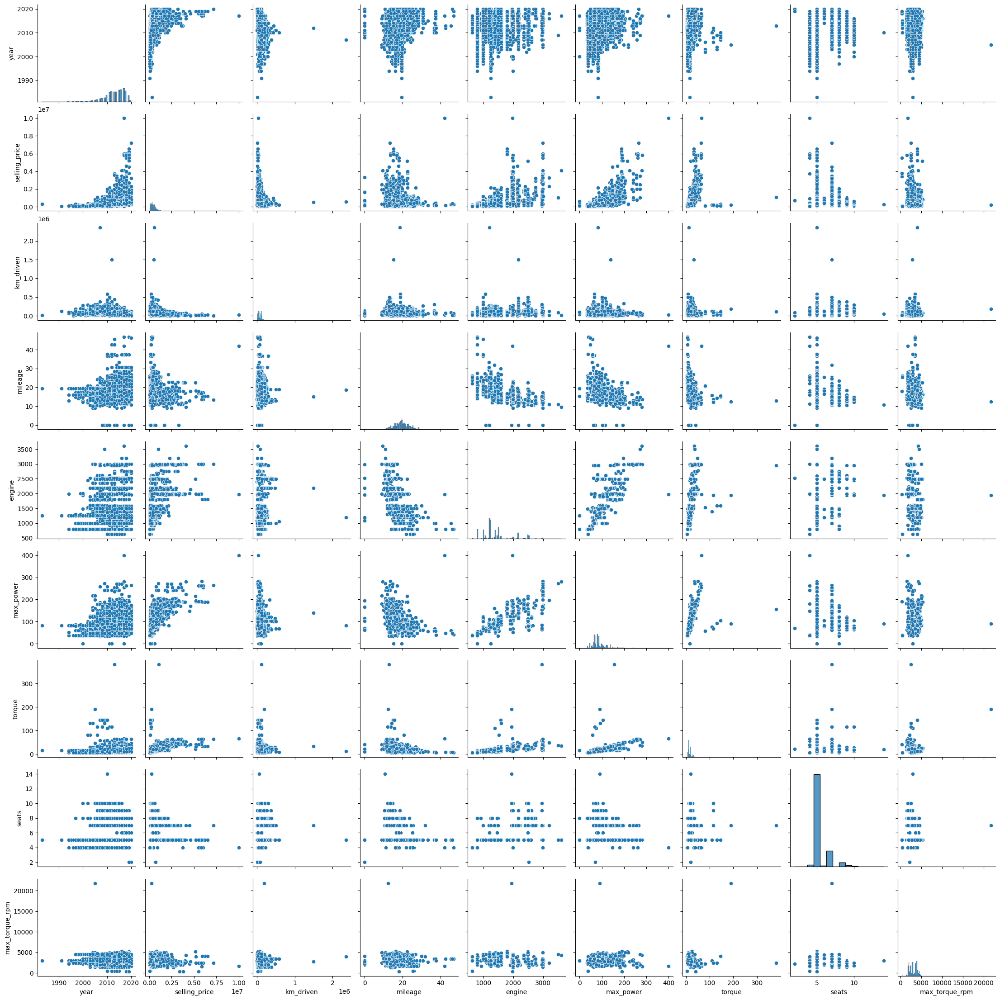

In [465]:
# your code here
sns.pairplot(df_train.select_dtypes('number'))

Можно ли предположить на основе распределений связь признаков с целевой переменной?

> Можно заметить сильную положительную корреляцию между max_power и year с целевой переменной selling_price.

Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?
> Между следующими парами признаков, судя по графикам разброса, присутствует положительная корреляция Engine и max_power, torque и engine, torgue и max_power.
По остальным парам признаков можно говорить о наличии слабых корреляций либо их отсутствии.  

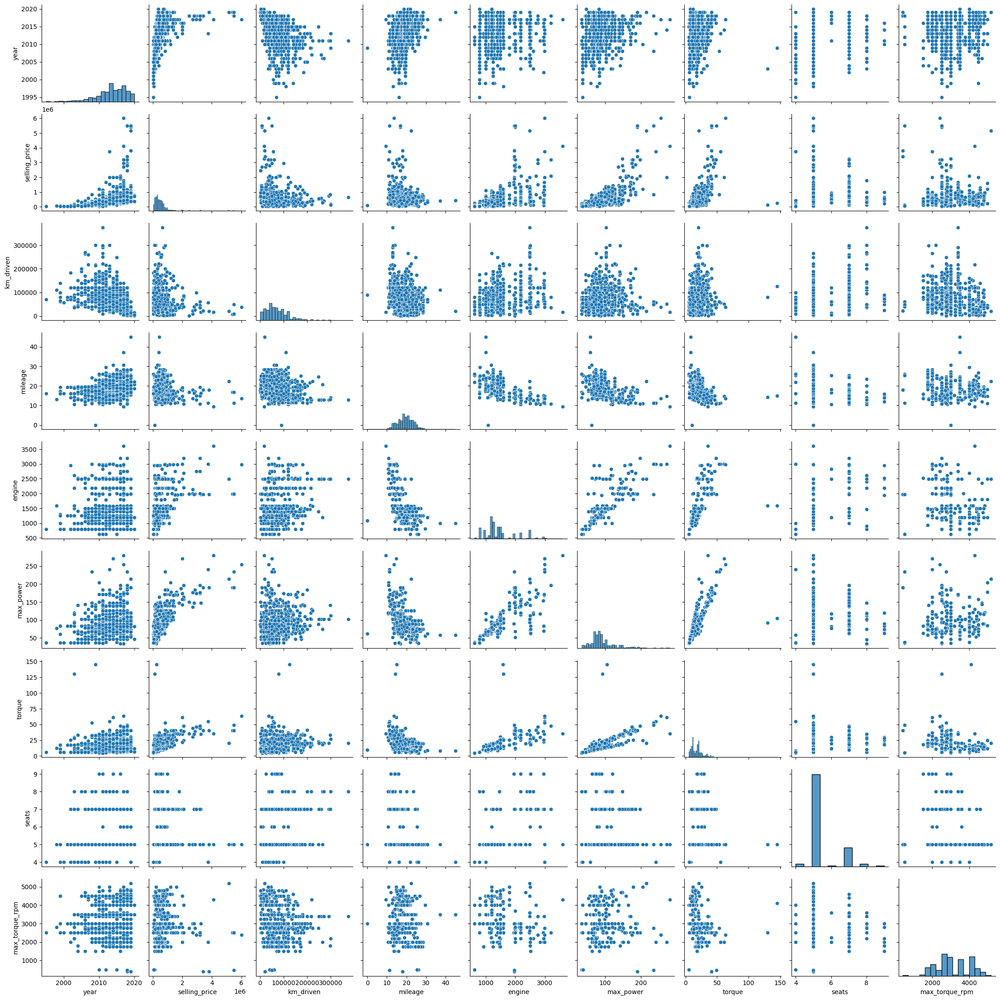

In [466]:
sns.pairplot(df_test.select_dtypes('number'))

Похожими ли оказались совокупности при разделении на трейн и тест?
> Положительная корреляция между переменными max_power и year с целевой переменной selling_price сохраняются и на тесте.

> Положительная корреляция между engine и max_power сохраняется и даже более ярко выражена на тесте.

> Положительная корреляция между парами torque и engine и torque и max_power сохраняется на таком же уровне, как и на трейне.

### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

<Axes: >

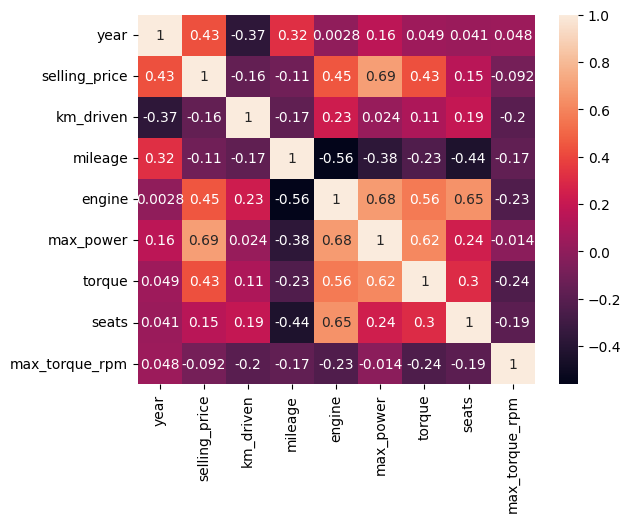

In [467]:
# your code here
sns.heatmap(df_train.corr(numeric_only=True), annot=True)

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?
 - Изучите типы корреляций в `pd.corr()`. Какую вы использовали по умолчанию?

**Какие 2 признака наименее скоррелированы между собой?**
> max_power и max_torque_rpm - 0.048

**Между какими наблюдается довольно сильная положительная линейная зависимость?**
1) max_power и selling_price - 0.69,
2) max_power и engine - 0.68,
3) seats и engine - 0.65

**Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?**

Однозначно утверждать нельзя, так как корреляция показывает связь, а не зависимость. Но можно это предположить, так как между переменной года и пробегом присутствует отрицательная корреляция (-0.37).

**Изучите типы корреляций в pd.corr(). Какую вы использовали по умолчанию?**

По умолчанию используется корреляция Пирсона. В pd.corr присутсвуют также корреляции Тау-Кендала и Спирмена.

### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ] Сделайте выводы


Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


In [468]:
def rank(array, method='average'):
  rank_items = zip(np.sort(array), np.arange(1, len(array)+1))
  rank_dct = {}
  for key, value in rank_items:
    if key not in rank_dct:
      rank_dct[key] = []
    rank_dct[key].append(value)

  func = eval(f'np.{method}')
  map_arr = np.vectorize(lambda x, dct: func(dct[x]))
  return map_arr(array, rank_dct)

In [469]:
my_spearman_corr = df_train.select_dtypes('number').apply(rank, axis=0).corr()
my_spearman_corr

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.707123,-0.569659,0.340316,-0.038056,0.166267,0.106793,0.048291,0.076879
selling_price,0.707123,1.000000,-0.295665,0.017140,0.463577,0.612600,0.583663,0.317605,-0.120918
km_driven,-0.569659,-0.295665,1.000000,-0.195916,0.304504,0.040655,0.239606,0.195317,-0.314982
mileage,0.340316,0.017140,-0.195916,1.000000,-0.438473,-0.318462,-0.169202,-0.437778,-0.175713
engine,-0.038056,0.463577,0.304504,-0.438473,1.000000,0.713435,0.839455,0.527716,-0.364814
max_power,0.166267,0.612600,0.040655,-0.318462,0.713435,1.000000,0.779571,0.304095,-0.018605
torque,0.106793,0.583663,0.239606,-0.169202,0.839455,0.779571,1.000000,0.436889,-0.520778
seats,0.048291,0.317605,0.195317,-0.437778,0.527716,0.304095,0.436889,1.000000,-0.189764
max_torque_rpm,0.076879,-0.120918,-0.314982,-0.175713,-0.364814,-0.018605,-0.520778,-0.189764,1.000000


In [470]:
pd_spearman_corr = df_train.select_dtypes('number').corr(method='spearman')
pd_spearman_corr


,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.707123,-0.569659,0.340316,-0.038056,0.166267,0.106793,0.048291,0.076879
selling_price,0.707123,1.000000,-0.295665,0.017140,0.463577,0.612600,0.583663,0.317605,-0.120918
km_driven,-0.569659,-0.295665,1.000000,-0.195916,0.304504,0.040655,0.239606,0.195317,-0.314982
mileage,0.340316,0.017140,-0.195916,1.000000,-0.438473,-0.318462,-0.169202,-0.437778,-0.175713
engine,-0.038056,0.463577,0.304504,-0.438473,1.000000,0.713435,0.839455,0.527716,-0.364814
max_power,0.166267,0.612600,0.040655,-0.318462,0.713435,1.000000,0.779571,0.304095,-0.018605
torque,0.106793,0.583663,0.239606,-0.169202,0.839455,0.779571,1.000000,0.436889,-0.520778
seats,0.048291,0.317605,0.195317,-0.437778,0.527716,0.304095,0.436889,1.000000,-0.189764
max_torque_rpm,0.076879,-0.120918,-0.314982,-0.175713,-0.364814,-0.018605,-0.520778,-0.189764,1.000000


In [471]:
np.round(np.linalg.norm(my_spearman_corr - pd_spearman_corr), 10)

np.float64(0.0)

> Вторая норма разницы библиотечной матрицы корреляции с моей матрицей корреляции Спирмена нулевая, поэтому различий нет (разве что в скорости из-за невекторной реализации моей функции ранга).

> Матрица корреляции показывает, что между переменными torque и max_power/engine связь еще более сильная, чем в матрице корреляций Пирсона.

> Также усилилась связь с 0.4 до 0.7 между ценой и годом выпуска машины. И усилилась обратная связь между пробегом и годом выпуска с 0.37 до 0.56.

In [472]:
pip install phik

In [473]:
import phik
df_train.select_dtypes('number').phik_matrix()

interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.219841,0.081574,0.277748,0.213156,0.388533,0.096843,0.288178,0.107833
selling_price,0.219841,1.000000,0.000000,0.448047,0.503682,0.872166,0.425649,0.196447,0.070343
km_driven,0.081574,0.000000,1.000000,0.181072,0.210747,0.000000,0.000000,0.096223,0.000000
mileage,0.277748,0.448047,0.181072,1.000000,0.661967,0.530364,0.151351,0.523230,0.327869
engine,0.213156,0.503682,0.210747,0.661967,1.000000,0.721079,0.461572,0.603400,0.466539
max_power,0.388533,0.872166,0.000000,0.530364,0.721079,1.000000,0.579195,0.568452,0.276944
torque,0.096843,0.425649,0.000000,0.151351,0.461572,0.579195,1.000000,0.206688,0.743251
seats,0.288178,0.196447,0.096223,0.523230,0.603400,0.568452,0.206688,1.000000,0.259131
max_torque_rpm,0.107833,0.070343,0.000000,0.327869,0.466539,0.276944,0.743251,0.259131,1.000000


In [474]:
df_train.select_dtypes('number').corr(method='spearman') - df_train.select_dtypes('number').phik_matrix()

interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,0.000000,0.487281,-0.651233,0.062569,-0.251211,-0.222265,0.009950,-0.239888,-0.030954
selling_price,0.487281,0.000000,-0.295665,-0.430907,-0.040106,-0.259566,0.158014,0.121157,-0.191261
km_driven,-0.651233,-0.295665,0.000000,-0.376988,0.093756,0.040655,0.239606,0.099094,-0.314982
mileage,0.062569,-0.430907,-0.376988,0.000000,-1.100440,-0.848826,-0.320553,-0.961008,-0.503582
engine,-0.251211,-0.040106,0.093756,-1.100440,0.000000,-0.007644,0.377883,-0.075684,-0.831353
max_power,-0.222265,-0.259566,0.040655,-0.848826,-0.007644,0.000000,0.200376,-0.264356,-0.295549
torque,0.009950,0.158014,0.239606,-0.320553,0.377883,0.200376,0.000000,0.230200,-1.264029
seats,-0.239888,0.121157,0.099094,-0.961008,-0.075684,-0.264356,0.230200,0.000000,-0.448895
max_torque_rpm,-0.030954,-0.191261,-0.314982,-0.503582,-0.831353,-0.295549,-1.264029,-0.448895,0.000000


Phi_k матрица занулила связи между пробегом и ценой (что нелогично), но усилила значимость таких переменных, как max_power, torque с ценой.

### **Дополнительные визуализации (бонус 0.25 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.
Один график: 0.125 балла, при условии, что он обоснован.

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [475]:
df_train_r = df_train.copy(deep=True).select_dtypes('number')\
                                     .drop(columns=['year', 'engine'])

df_test_r = df_test.copy(deep=True).select_dtypes('number')\
                                   .drop(columns=['year', 'engine'])

In [476]:
y_train = df_train_r['selling_price']
X_train = df_train_r.drop(columns='selling_price')

In [477]:
assert X_train.shape == (5840, 6)

In [478]:
y_test = df_test_r['selling_price']
X_test = df_test_r.drop(columns='selling_price')

In [479]:
assert X_test.shape == (1000, 6)

### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [480]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression()

In [481]:
y_pred = lm.predict(X_test)

def get_regr_results(y_test, y_pred):
  print('R^2: {:.3f}, MSE: {:.3f}'.format(r2_score(y_test, y_pred), MSE(y_test, y_pred)))

get_regr_results(y_test, y_pred)

R^2: 0.573, MSE: 245409833082.676


Модель объясняет 57% дисперсии цены, но имеет высокую MSE, поэтому нужны улучшение спецификации или дополнительные переменные.

### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

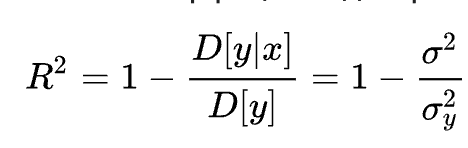

sigma^2 - дисперсия ошибки модели (то есть насколько сильно предсказанные моделью значения отличаются от истинных значений), сумма квадратов остатков

sigma^2_y - дисперсия целевой переменной (насколько высокий разброс значений переменной от ее среднего значения)

In [482]:
def r2_score_my(y_true: np.typing.NDArray, y_pred: np.typing.NDArray) -> np.float64:
  return 1 - np.sum((y_true - y_pred)**2)/np.sum((y_true - y_true.mean())**2)

np.round(r2_score_my(y_test, y_pred), 3)

np.float64(0.573)

### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

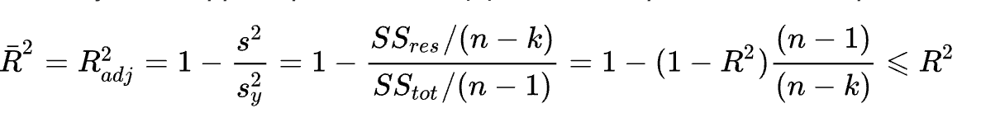

In [483]:
# your code here
def r2_score_adj_my(y_true, y_pred, k):
  n = len(y_true)
  return 1 - (1 - r2_score_my(y_true, y_pred))*((n - 1) / (n - k))

print(np.round(r2_score_adj_my(y_test, y_pred, df_train_r.shape[1]), 3))

0.57


> Когда переменных становится слишком много, применяется r2_adj, так как он штрафует на количество переменных и уменьшает r2 при их увеличении.

> Основная проблема, что обычный r2 всегда увеличивается при добавлении новых переменных независимо от того, имеют они отношение к таргету или нет.   

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [484]:
from sklearn.preprocessing import StandardScaler

ss = StandardScaler().fit(X_train, y_train)

train_r_ss = ss.fit_transform(X_train, y_train)
test_r_ss = ss.fit_transform(X_test, y_test)

X_train_ss, y_train_ss = train_r_ss[:, :-1], train_r_ss[:, -1]
X_test_ss, y_test_ss = test_r_ss[:, :-1], test_r_ss[:, -1]

In [485]:
lm = LinearRegression()
lm.fit(X_train_ss, y_train_ss)

y_pred_ss = lm.predict(X_test_ss)
get_regr_results(y_test_ss, y_pred_ss)

R^2: 0.283, MSE: 0.717


### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [486]:
# your code here
lm_weights = pd.Series(dict(zip(X_test.columns, np.abs(lm.coef_).round(3))))
lm_weights

,0
km_driven,0.180
mileage,0.332
max_power,0.104
torque,0.292
seats,0.243


> Наиболее информативным оказался пробег в милях

### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [487]:
from sklearn.linear_model import Lasso

lm_lasso = Lasso()
lm_lasso.fit(X_train_ss, y_train_ss)

Lasso()

In [488]:
y_pred = lm_lasso.predict(X_test_ss)
get_regr_results(y_test, y_pred)

R^2: -0.664, MSE: 956630253343.130


Качество Lasso регресии хуже, чем классической регресии без регуляризации.

In [489]:
lm_lasso.coef_, lm_lasso.intercept_

(array([-0., -0., -0., -0., -0.]), np.float64(9.976798687042502e-17))

In [490]:
lm_weights, lm.intercept_

(km_driven    0.180
 mileage      0.332
 max_power    0.104
 torque       0.292
 seats        0.243
 dtype: float64,
 np.float64(3.338124777844431e-16))

L1-регуляризация занулила все веса модели, так как это ее уникальное свойство - она зануляет маленькие веса из модели линейной регресии. Если посмотреть на данные выше, все веса изначальной модели были не более 0.3 по модулю. Поэтому модель занулила веса, решив, что эти переменные не объясняют дисперсию таргета.

### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

In [491]:
from sklearn.model_selection import GridSearchCV

lasso_cv = Lasso()
param_grid = {
    "alpha": [0.01, 0.1, 1],
    "max_iter": [1000, 5000, 10000],
}

clf1 = GridSearchCV(lasso_cv, param_grid, cv=10)

In [492]:
clf1.fit(X_train_ss, y_train_ss)

GridSearchCV(cv=10, estimator=Lasso(),
             param_grid={'alpha': [0.01, 0.1, 1],
                         'max_iter': [1000, 5000, 10000]})

In [493]:
print("Лучшие параметры:", clf1.best_params_)
print("Лучшая ошибка:", round(clf1.best_score_, 3))

best_model = clf1.best_estimator_
coef = best_model.coef_

print("Количество нулевых коэффициентов:", np.sum(coef == 0))
print("Всего коэффициентов:", len(coef))
print("Сами коэффициенты:", np.round(coef, 3))
print("R^2 лучшей модели:", round(r2_score(y_test_ss, best_model.predict(X_test_ss)), 3))

Лучшие параметры: {'alpha': 0.01, 'max_iter': 1000}
Лучшая ошибка: 0.187
Количество нулевых коэффициентов: 0
Всего коэффициентов: 5
Сами коэффициенты: [-0.172 -0.318  0.082 -0.27  -0.23 ]
R^2 лучшей модели: 0.276


Сколько грид-сёрчу пришлось обучать моделей?
> 3 * 3 * 10 = 90 моделей

Что значит каждый параметр param_grid, который вы заполняли для GridSearch? Опишите каждый
1) alpha — сила регуляризации, с какой модель штрафуется. Большие значения обнуляют больше весов.
2) max_iter - максимальное число шагов оптимизатора. При слишком малом значении алгоритм может не сойтись.

Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

> Alpha лучшей модели равен 0.01. Нет, все веса больше нуля.

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

In [494]:
from sklearn.linear_model import ElasticNet

en = ElasticNet()
param_grid = {
    "alpha": [0.01, 0.1, 1],
    "l1_ratio": [0.1, 0.5, 0.7, 0.9],
    "max_iter": [1000, 5000, 10000],
}

clf2 = GridSearchCV(en, param_grid, cv=10)

In [495]:
clf2.fit(X_train_ss, y_train_ss)

GridSearchCV(cv=10, estimator=ElasticNet(),
             param_grid={'alpha': [0.01, 0.1, 1],
                         'l1_ratio': [0.1, 0.5, 0.7, 0.9],
                         'max_iter': [1000, 5000, 10000]})

In [496]:
print("Лучшие параметры:", clf2.best_params_)
print("Лучшая ошибка:", round(clf2.best_score_, 3))

best_model = clf2.best_estimator_
coef = best_model.coef_

print("Количество нулевых коэффициентов:", np.sum(coef == 0))
print("Всего коэффициентов:", len(coef))
print("Сами коэффициенты:", np.round(coef, 3))
print("R^2 лучшей модели:", round(r2_score(y_test_ss, best_model.predict(X_test_ss)), 3))

Лучшие параметры: {'alpha': 0.1, 'l1_ratio': 0.1, 'max_iter': 1000}
Лучшая ошибка: 0.19
Количество нулевых коэффициентов: 0
Всего коэффициентов: 5
Сами коэффициенты: [-0.159 -0.278  0.065 -0.239 -0.202]
R^2 лучшей модели: 0.262


Сколько грид-сёрчу пришлось обучать моделей?
> 3 * 4 * 3 * 10 = 120 моделей

Что значит каждый параметр param_grid, который вы заполняли для GridSearch? Опишите каждый
1) alpha — сила регуляризации, с какой модель штрафуется. Большие значения обнуляют больше весов.
2) l1_ratio - баланс между L1 и L2 регуляризацией.
3) max_iter - максимальное число шагов оптимизатора. При слишком малом значении алгоритм может не сойтись.

Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

> Alpha лучшей модели равен 0.01, l1_ration = 0.1, max_iter = 1000.

### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [497]:
from itertools import combinations

n_features = X_train_ss.shape[1]
lambda_l0 = 1
best_loss = 1e9
best_mask = None
best_coef = None
best_model_l0 = None
best_lambda_l0 = None

# перебор lambda и комбинаций фич
for lambda_l0 in np.arange(0, 1, 0.1):
  for k in range(1, n_features + 1):
      for idx in combinations(range(n_features), k):
          X = X_train_ss[:, idx]
          lm = LinearRegression()
          lm.fit(X, y_train_ss)

          y_pred = lm.predict(X_test_ss[:, idx])

          loss = MSE(y_test_ss, y_pred) + lambda_l0 * k

          if loss < best_loss:
            best_loss = loss
            best_mask = idx
            best_coef = lm.coef_
            best_model_l0 = lm
            best_lambda_l0 = lambda_l0

print(best_coef, best_mask, best_loss, best_lambda_l0, sep='\n')

[-0.1796491  -0.33205296  0.10382143 -0.29192986 -0.24330087]
(0, 1, 2, 3, 4)
0.7166009665988654
0.0


По итогу экспериментов при полном переборе всех гиперпараметров выяснилось, что лучшая модель при L0 регуляризации включает все 5 независимых переменных.

# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [498]:
# your code here
print('Изначальное количество категорий в name (train):', df_train['name'].nunique())

X_train_cat = df_train.copy(deep=True)
X_train_cat['name'] = pd.Categorical(X_train_cat['name'].str.split().str[0])

print('Итоговое количество категорий в name (train):', X_train_cat['name'].nunique())

Изначальное количество категорий в name (train): 1924
Итоговое количество категорий в name (train): 30


In [499]:
X_train_cat = X_train_cat.drop(columns=['year', 'engine'])
cat_columns = X_train_cat.select_dtypes('object').columns
X_train_cat[cat_columns] = X_train_cat[cat_columns].apply(pd.Categorical, axis=0)

In [500]:
X_train_cat = X_train_cat.drop(columns=['selling_price']).select_dtypes(['number', 'category'])
X_train_cat

,name,km_driven,fuel,seller_type,transmission,owner,mileage,max_power,torque,seats,max_torque_rpm
0,Maruti,145500,Diesel,Individual,Manual,First Owner,23.40,74.00,19.3800,5,2000.0
1,Skoda,120000,Diesel,Individual,Manual,Second Owner,21.14,103.52,25.5000,5,2500.0
2,Hyundai,127000,Diesel,Individual,Manual,First Owner,23.00,90.00,22.4000,5,2750.0
3,Maruti,120000,Petrol,Individual,Manual,First Owner,16.10,88.20,11.5000,5,4500.0
4,Hyundai,45000,Petrol,Individual,Manual,First Owner,20.14,81.86,11.6025,5,4000.0
...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai,191000,Petrol,Individual,Manual,First Owner,17.92,62.10,9.8022,5,3000.0
5836,Maruti,50000,Petrol,Individual,Manual,Second Owner,18.90,67.10,9.1800,5,3500.0
5837,Hyundai,110000,Petrol,Individual,Manual,First Owner,18.50,82.85,11.5974,5,4000.0
5838,Hyundai,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,110.00,24.0000,5,2750.0


In [501]:
assert X_train_cat.shape == (5840, 11)

In [502]:
X_train_cat.describe(include='category')

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,30,4,3,2,5
top,Maruti,Diesel,Individual,Manual,First Owner
freq,1804,3177,5223,5336,3603


### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [503]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

X_train_cat['seats'] = pd.Categorical(X_train_cat['seats'])

In [504]:
dummies = pd.get_dummies(X_train_cat.select_dtypes('category'), drop_first=True)
dummies.head()

,name_Audi,name_BMW,name_Chevrolet,name_Daewoo,name_Datsun,name_Fiat,name_Force,name_Ford,name_Honda,name_Hyundai,...,owner_Test Drive Car,owner_Third Owner,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9,seats_10,seats_14
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,True,...,False,False,False,True,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,True,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,True,...,False,False,False,True,False,False,False,False,False,False


### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

Как корректно работать с OHE преобразованием?
> Мы используем его, когда переменная имеет ограниченное конечное количество категорий, которые можно однозначно получить.

Почему мы удаляем один столбец?
> Чтобы избежать dummy-ловушки, когда появляется мультиколлинеарность из-за линейной зависимости всех dummy-столбцов и интерсепта. Также n-ый признак хранит излишнюю информацию, его значение однозначно можно получить по n-1 признаку, которые остаются в модели.

Пусть из  𝑛  признаков мы получили  𝑛−1  столбец, из которых  𝑘<𝑛−1  оказались не важными по весам модели. Корректно ли их удалить?
> Нет, в таком случае потеряется информация об удаляемых признаках и невозможно будет различать наблюдения, равные по всем другим столбцам.

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [505]:
from sklearn.linear_model import Ridge

ridge_cv = Ridge()
param_grid = {
    "alpha": [0.01, 0.1, 1],
    "max_iter": [1000, 5000, 10000],
}

clf3 = GridSearchCV(ridge_cv, param_grid, cv=10)

In [506]:
clf3.fit(X_train_ss, y_train_ss)

GridSearchCV(cv=10, estimator=Ridge(),
             param_grid={'alpha': [0.01, 0.1, 1],
                         'max_iter': [1000, 5000, 10000]})

In [507]:
print("Лучшие параметры:", clf3.best_params_)
print("Лучшая ошибка:", round(clf3.best_score_, 3))

best_model = clf3.best_estimator_
coef = best_model.coef_

print("Количество нулевых коэффициентов:", np.sum(coef == 0))
print("Всего коэффициентов:", len(coef))
print("Сами коэффициенты:", np.round(coef, 3))
print("R^2 лучшей модели:", round(r2_score(y_test_ss, best_model.predict(X_test_ss)), 3))

Лучшие параметры: {'alpha': 1, 'max_iter': 1000}
Лучшая ошибка: 0.187
Количество нулевых коэффициентов: 0
Всего коэффициентов: 5
Сами коэффициенты: [-0.18  -0.332  0.104 -0.292 -0.243]
R^2 лучшей модели: 0.283


Удалось ли улучшить качество прогнозов?
> Да, но незначительно. Всего на 0.007, то есть на 0.7%.

# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 1-х балла в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

In [508]:
# генерация новых признаков на основе существующих
df_train2 = df_train.copy(deep=True)
df_test2 = df_test.copy(deep=True)

number_columns = df_train2.select_dtypes('number').columns
ss = StandardScaler()
ss.fit(df_train2[number_columns])
df_train2[number_columns] = ss.transform(df_train2[number_columns])
df_test2[number_columns] = ss.transform(df_test2[number_columns])

df_train2['year^2'] = df_train2['year']**2
df_test2['year^2'] = df_test2['year']**2


target = 'selling_price'
model_columns = df_train2.select_dtypes('number').columns.drop([target, 'engine', 'seats'])

lm_f = LinearRegression()
lm_f.fit(df_train2[model_columns], df_train2[target])


get_regr_results(df_test2[target], lm_f.predict(df_test2[model_columns]))
pd.Series(dict(zip(model_columns, lm_f.coef_.round(3))))

R^2: 0.625, MSE: 0.752


,0
year,0.418
km_driven,-0.056
mileage,-0.010
max_power,0.641
torque,0.007
max_torque_rpm,-0.127
year^2,0.102


Действительно, переменная года имеет высокий вес в модели. И не только сам год, но и его квадрат, то есть зависимость между ценой и годом имеет многокомпонентую структуру - как линейную, так и квадратичную.

Модель стала лучше аж на 40%.

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [509]:
def business_metric(y_true, y_pred):
  amount = np.sum(np.abs(y_true - y_pred) <= 0.1)
  share = amount / len(y_true)
  return np.round(share, 3)

business_metric(df_test2[target], lm_f.predict(df_test2[model_columns]) )

np.float64(0.254)

In [510]:
models = clf1.best_estimator_, clf2.best_estimator_, clf3.best_estimator_

[*[business_metric(y_test_ss, model.predict(X_test_ss)) for model in models],
business_metric(df_test2[target], lm_f.predict(df_test2[model_columns]))]

[np.float64(0.093), np.float64(0.085), np.float64(0.098), np.float64(0.254)]

Лучшей моделью оказалась регрессия без регуляризации с дополнительными переменными в виде года и квадрата года.

### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



In [547]:
from sklearn.metrics import mean_absolute_percentage_error as MAPE
def your_business_metric(y_true, y_pred):
    return np.round(np.mean(np.abs(y_true - y_pred) / np.abs(y_true)), 3)

(your_business_metric(df_test2[target], lm_f.predict(df_test2[model_columns])),

np.round(MAPE(df_test2[target], lm_f.predict(df_test2[model_columns])), 3))

(np.float64(2.621), np.float64(2.621))

Для этой задачи больше подходит MAPE, так как она больше штрафует недопрогноз, чем перепрогноз.

In [512]:
[*[your_business_metric(y_test_ss, model.predict(X_test_ss)) for model in models],
your_business_metric(df_test2[target], lm_f.predict(df_test2[model_columns]))]

[np.float64(1.091), np.float64(1.06), np.float64(1.103), np.float64(2.621)]

In [513]:
models[1]

ElasticNet(alpha=0.1, l1_ratio=0.1)

Лучше всего эту задачу решает ElasticNet, но разница между ошибками среди моделей в целом небольшая - максимум 1.5%. Поэтому лучшей моделью можно считать модель с дополнительными признаками года и его квадрата.

In [560]:
import pickle

with open('results.pkl', 'wb') as f:
    pickle.dump({'StandardScaler': ss.scale_,
                 'best_model': lm_f}, f)

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 25**

**Результаты вашей работы** необходимо разместить в своем Гитхабе. Далее в этот же репозиторий вы прикрепите вторую часть. Под результатами первой части понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)